# Building a table image to .csv pipeline

## Install libraries

In [166]:
%pip install transformers
%pip install pillow huggingface_hub
%pip install timm
%pip install matplotlib

## Table detection

What do you understand by table detection?

Definition: Given an image, finding the region of the table as a bounding box.

In [167]:
from huggingface_hub import hf_hub_download
from transformers import AutoImageProcessor, TableTransformerForObjectDetection
import torch
from PIL import Image

file_path = hf_hub_download(repo_id="nielsr/example-pdf", repo_type="dataset", filename="example_pdf.png")
image = Image.open(file_path).convert("RGB")



Let's look at the page image

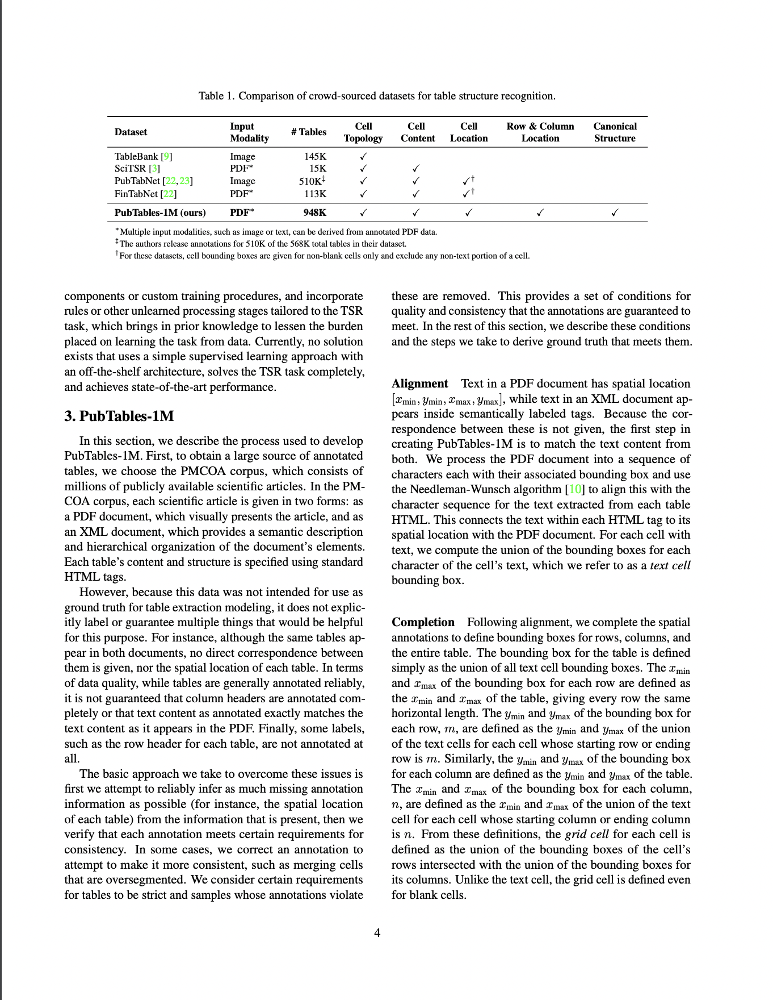

In [168]:
image

In [169]:
image_processor = AutoImageProcessor.from_pretrained("microsoft/table-transformer-detection")
model = TableTransformerForObjectDetection.from_pretrained("microsoft/table-transformer-detection")

inputs = image_processor(images=image, return_tensors="pt")
outputs = model(**inputs)

# convert outputs (bounding boxes and class logits) to Pascal VOC format (xmin, ymin, xmax, ymax)
target_sizes = torch.tensor([image.size[::-1]])
results = image_processor.post_process_object_detection(outputs, threshold=0.9, target_sizes=target_sizes)[
    0
]

for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    print(
        f"Detected {model.config.id2label[label.item()]} with confidence "
        f"{round(score.item(), 3)} at location {box}"
    )

Some weights of the model checkpoint at microsoft/table-transformer-detection were not used when initializing TableTransformerForObjectDetection: ['model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing TableTransformerForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TableTransformerForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Detected table with confidence 1.0 at location [202.02, 210.86, 1119.51, 385.44]


In [170]:
image.size


(1362, 1760)

In [171]:
print(model)

TableTransformerForObjectDetection(
  (model): TableTransformerModel(
    (backbone): TableTransformerConvModel(
      (conv_encoder): TableTransformerConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): TableTransformerFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): BasicBlock(
              (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn1): TableTransformerFrozenBatchNorm2d()
              (drop_block): Identity()
              (act1): ReLU(inplace=True)
              (aa): Identity()
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): TableTransformerFrozenBatchNorm2d()
              (act2): ReLU(inplac

In [172]:
type(inputs)

transformers.image_processing_base.BatchFeature

In [173]:
inputs["pixel_values"].shape

torch.Size([1, 3, 800, 619])

In [174]:
inputs["pixel_values"][0]

tensor([[[-0.9534,  1.0331,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [-0.9877,  1.0159,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [-1.0219,  0.9988,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [-1.0219,  0.9988,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [-1.0219,  0.9988,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [-1.0390,  0.9988,  2.2489,  ...,  2.2489,  2.2489,  2.2489]],

        [[-0.8102,  1.2031,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [-0.8452,  1.1856,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [-0.8803,  1.1856,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [-0.8803,  1.1681,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [-0.8803,  1.1681,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [-0.8803,  1.1681,  2.4286,  ...,  2.4286,  2.4286,  2.4286]],

        [[-0.5321,  1.4374,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [-0.5844,  1.4025,  2.6400,  ...,  2

In [175]:
inputs["pixel_values"][0,:,340,340]

tensor([2.2489, 2.4286, 2.6400])

Let's visualise the table on the page image

In [176]:

from PIL import ImageDraw

def visualize_bbox(image, box, color="red", width=2):
  """
  Visualizes a bounding box on a PIL image.

  Args:
    image: A PIL Image object.
    box: A list or tuple of four integers representing the bounding box
         coordinates (xmin, ymin, xmax, ymax).
    color: The color of the bounding box (default: red).
    width: The width of the bounding box lines (default: 2).
  """

  draw = ImageDraw.Draw(image)
  draw.rectangle(box, outline=color, width=width)
  return image


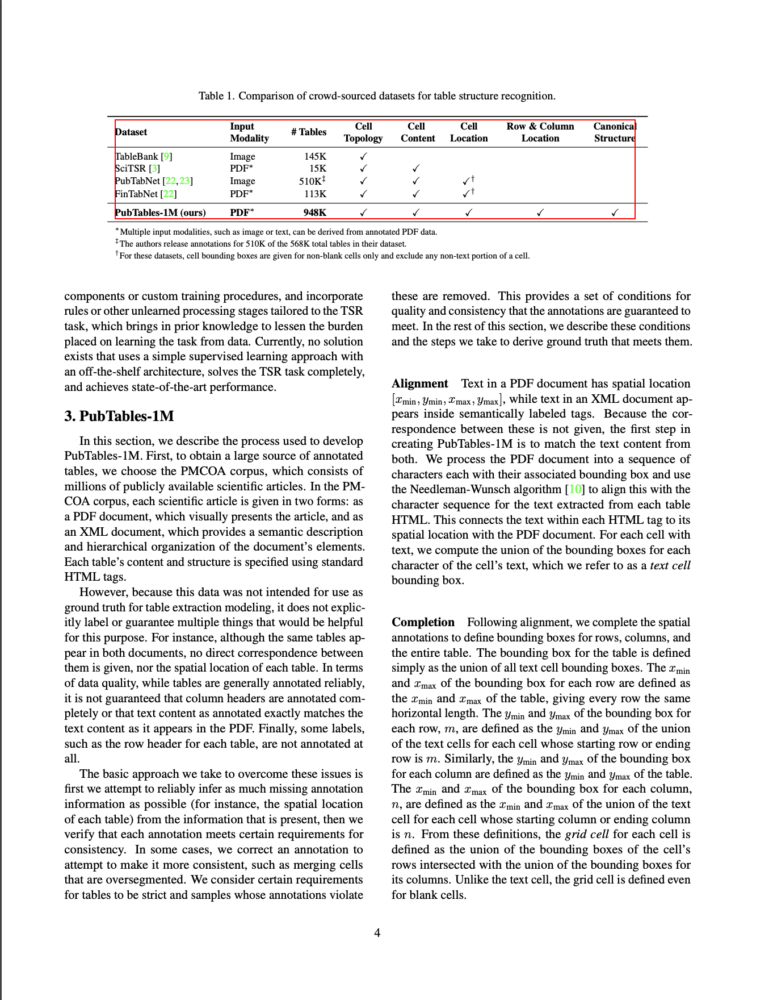

In [177]:
visualize_bbox(image, results["boxes"][0].tolist())

**bold text**## Table structure recognition

What do you understand by table structure recognition?

Definition: Given an image of a table, identifying the rows, columns, and column headers.


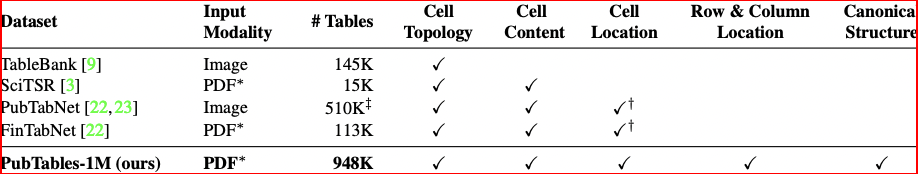

In [178]:
# Let's crop the table image from the page

table_image = image.crop(box)

table_image

What's the problem with the above cropped table? Do you see any issues?

What can we do differently?

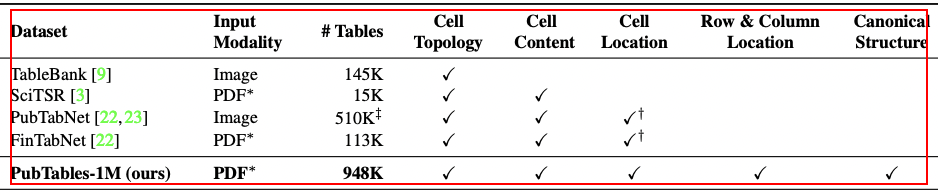

In [179]:
# Let's add some padding to the box so that we don't crop too close to the table.

padding = 10

box = [box[0] - padding, box[1] - padding, box[2] + padding, box[3] + padding]

table_image = image.crop(box)

table_image

Let's now do table structure recognition on the table image.

In [180]:
import matplotlib.pyplot as plt
from transformers import DetrFeatureExtractor, DetrForObjectDetection

In [181]:
COLORS = [
    [0.000, 0.447, 0.741],
    [0.850, 0.325, 0.098],
    [0.929, 0.694, 0.125],
    [0.494, 0.184, 0.556],
    [0.466, 0.674, 0.188],
    [0.301, 0.745, 0.933],
]

def plot_simple_box(table_img, bboxes, file_name="output.png"):
    plt.figure(figsize=(16, 10))
    plt.imshow(table_img)
    ax = plt.gca()
    colors = COLORS * 100
    for bbox, c in zip(bboxes, colors):
        ax.add_patch(
            plt.Rectangle(
                (bbox[0], bbox[1]),
                bbox[2] - bbox[0],
                bbox[3] - bbox[1],
                fill=False,
                color=c,
                linewidth=0.5,
            )
        )
    plt.axis("off")
    plt.show()
    plt.savefig(f"{file_name}.png", bbox_inches="tight")




In [182]:
model_structure = TableTransformerForObjectDetection.from_pretrained(
    "microsoft/table-transformer-structure-recognition")


def get_row_col_bounds(table, ts_thresh=0.7, plot=False):
    feature_extractor = DetrFeatureExtractor()
    table_encoding = feature_extractor(table, return_tensors="pt")

    # predict table structure
    with torch.no_grad():
        outputs = model_structure(**table_encoding)

    # visualize table structure
    target_sizes = [table.size[::-1]]
    table_struct_results = feature_extractor.post_process_object_detection(
        outputs, threshold=ts_thresh, target_sizes=target_sizes
    )[0]


    row_boxes = table_struct_results["boxes"][
        table_struct_results["labels"] == model_structure.config.label2id["table row"]
    ]

    row_scores = table_struct_results["scores"][
        table_struct_results["labels"] == model_structure.config.label2id["table row"]
    ]

    col_boxes = table_struct_results["boxes"][
        table_struct_results["labels"]
        == model_structure.config.label2id["table column"]
    ]

    col_scores = table_struct_results["scores"][
        table_struct_results["labels"]
        == model_structure.config.label2id["table column"]
    ]

    table_header_box = table_struct_results["boxes"][
        table_struct_results["labels"]
        == model_structure.config.label2id["table column header"]
    ]
    table_header_score = table_struct_results["scores"][
        table_struct_results["labels"]
        == model_structure.config.label2id["table column header"]
    ]

    print(f"Num rows initially detected: {len(row_boxes)}")
    print(f"Num cols initially detected: {len(col_boxes)}")
    print(f"Num table header detected: {len(table_header_box)}")


    return (
        row_boxes,
        row_scores,
        col_boxes,
        col_scores,
        table_header_box,
        table_header_score,
    )

Some weights of the model checkpoint at microsoft/table-transformer-structure-recognition were not used when initializing TableTransformerForObjectDetection: ['model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing TableTransformerForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TableTransformerForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [183]:
table_structure_outs = get_row_col_bounds(table_image)

Num rows initially detected: 5
Num cols initially detected: 7
Num table header detected: 1


In [184]:
## can you identify each of these components?
table_structure_outs

(tensor([[ 13.8462, 104.8486, 899.6822, 127.7524],
         [ 14.0068,  57.0947, 899.8804,  84.1945],
         [ 13.6592,  82.4375, 899.5753, 105.1078],
         [ 13.6076,  19.7961, 899.6664,  56.6409],
         [ 13.6984, 127.9520, 899.7661, 149.6090]]),
 tensor([0.9939, 0.9389, 0.9875, 0.9520, 0.9873]),
 tensor([[589.1208,  19.6075, 698.7053, 149.6950],
         [501.4056,  19.7475, 589.2468, 149.7181],
         [ 14.5201,  19.9277, 181.8019, 149.6259],
         [695.9993,  19.6024, 839.7112, 149.6203],
         [302.0485,  19.5608, 398.5411, 149.7270],
         [839.7183,  19.4531, 897.4878, 149.5298],
         [181.3766,  19.6560, 300.0316, 149.6975]]),
 tensor([0.9984, 0.9971, 0.9999, 0.9957, 0.9998, 0.9854, 0.9999]),
 tensor([[ 13.4891,  19.8061, 899.7009,  55.9953]]),
 tensor([0.9780]))

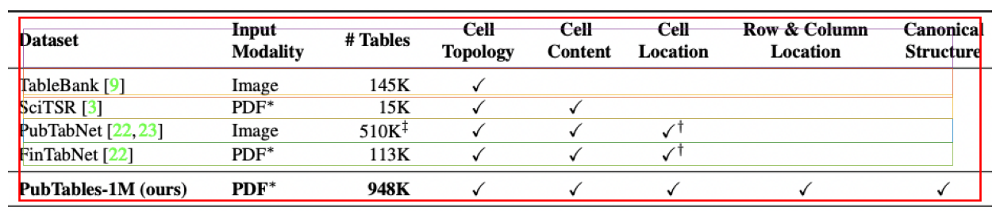

<Figure size 640x480 with 0 Axes>

In [185]:
# Let's visualise the rows first

plot_simple_box(table_image, table_structure_outs[0])

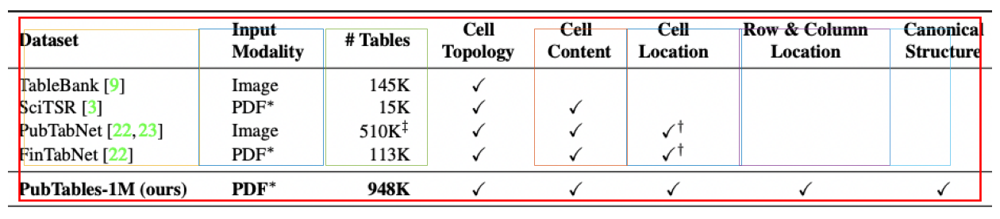

<Figure size 640x480 with 0 Axes>

In [186]:
# Let's visualise the columns

plot_simple_box(table_image, table_structure_outs[2])

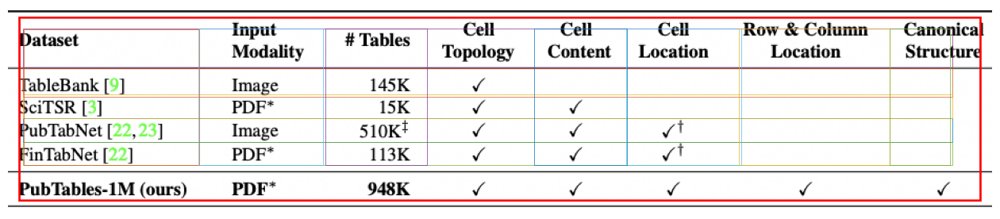

<Figure size 640x480 with 0 Axes>

In [187]:
# Let's visualise rows and columns together

plot_simple_box(table_image, table_structure_outs[0].tolist() + table_structure_outs[2].tolist())

### Issues with table structure recognition

Can you list the issues you see in the above table structure recognition?

### Rerunning the notebook with a 'simpler' table image

In [188]:
# prompt: connect my drive to colab

from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [127]:
table_image_path = "/content/drive/MyDrive/idp_bootcamp/week_3/hands_on_session/data/001e626d00966d0268d44ce686e8559b-118.png"

In [128]:
table_image = Image.open(table_image_path).convert("RGB")

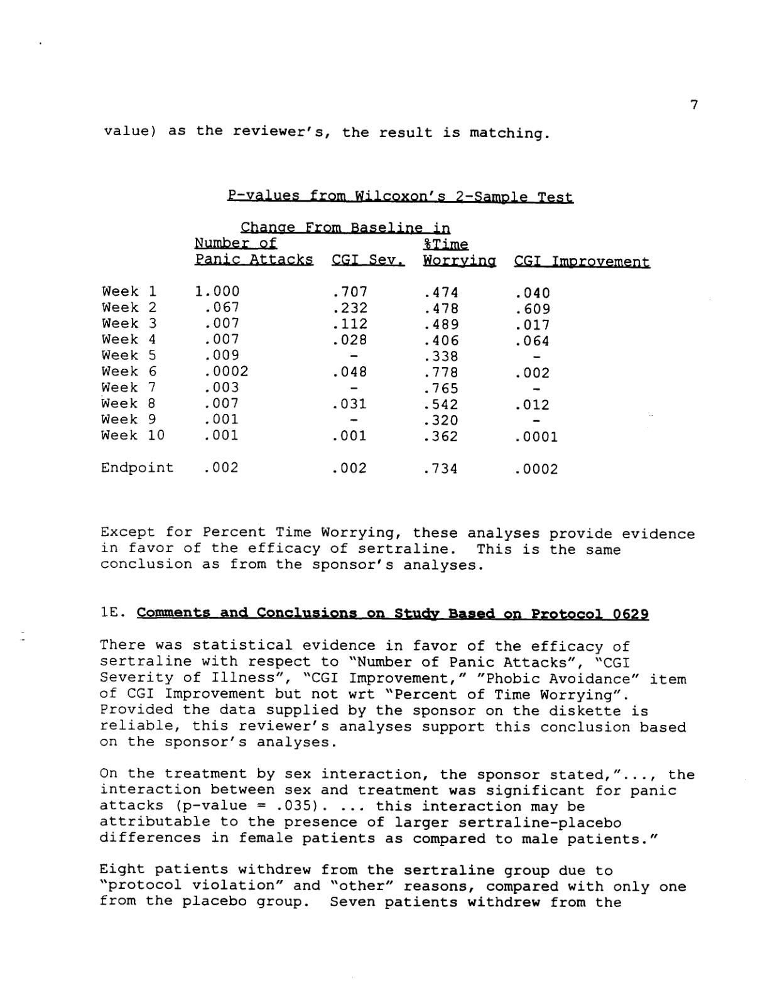

In [129]:
table_image

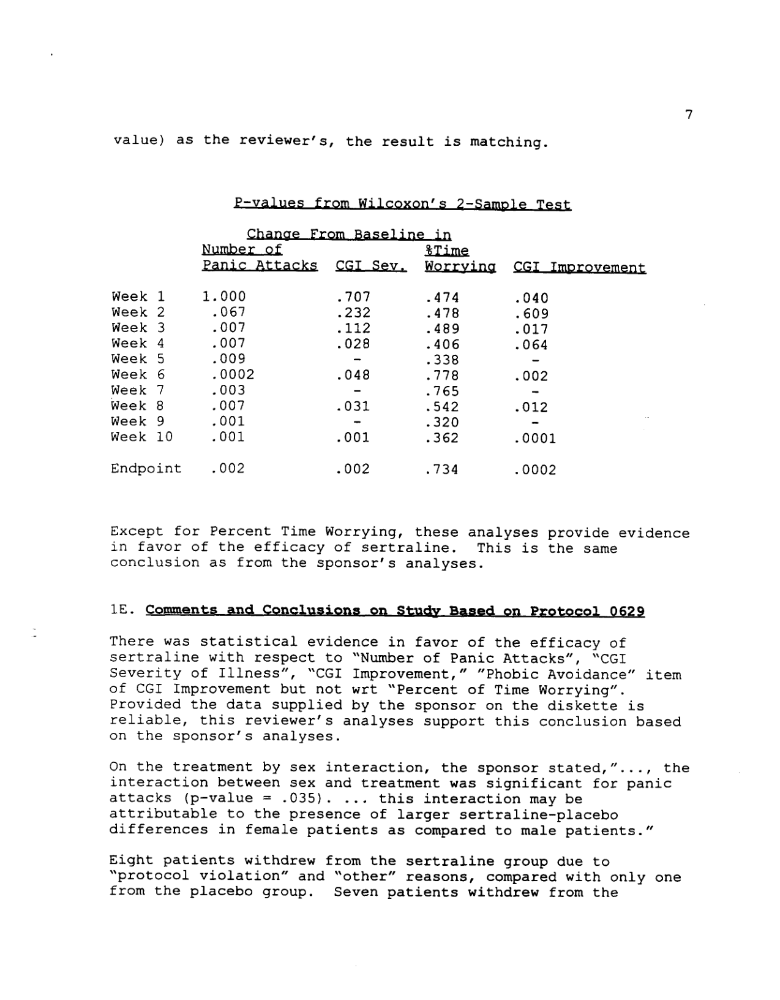

In [130]:
# prompt: add some padding white to PIL image 20 px

from PIL import Image

def add_padding(image, padding_width, color=(255, 255, 255)):
  """Adds padding to a PIL image.

  Args:
    image: The PIL Image object.
    padding_width: The width of the padding in pixels.
    color: The color of the padding (default: white).

  Returns:
    A new PIL Image object with the padding added.
  """
  width, height = image.size
  new_width = width + 2 * padding_width
  new_height = height + 2 * padding_width
  new_image = Image.new(image.mode, (new_width, new_height), color)
  new_image.paste(image, (padding_width, padding_width))
  return new_image


# Example usage
# Assuming you have a PIL image named `table_image`
padded_image = add_padding(table_image, 20)
padded_image # show the image with padding


In [131]:
table_structure_outs = get_row_col_bounds(padded_image)

Num rows initially detected: 22
Num cols initially detected: 8
Num table header detected: 0


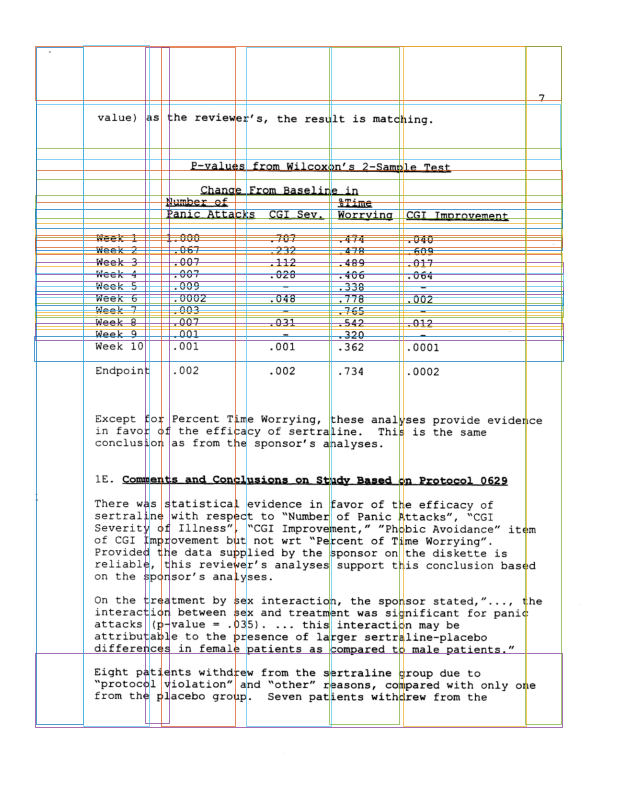

<Figure size 640x480 with 0 Axes>

In [132]:
plot_simple_box(padded_image, table_structure_outs[0].tolist() + table_structure_outs[2].tolist())

Is there a difference between first image and this image in table structure model performance?
What is the difference between the first image and this image which enables this difference?

## Decomposing cells

Can you write a function that takes the table_structure_outs and gives a list of cell bboxes?


In [133]:
def sort_row_col_boxes(row_boxes, col_boxes):
  row_boxes = row_boxes.tolist()
  col_boxes = col_boxes.tolist()
  row_boxes.sort(key=lambda x: x[1])
  col_boxes.sort(key=lambda x: x[0])
  return row_boxes, col_boxes

In [134]:
def get_cells_by_intersecting_rows_and_cols(row_boxes, col_boxes, padding=(0,0)):
  cells = []
  for row_box in row_boxes:
    for col_box in col_boxes:
      cells_left_upper_x = col_box[0]
      cells_left_upper_y = row_box[1]
      cells_right_lower_x = col_box[2]
      cells_right_lower_y = row_box[3]
      cells.append([cells_left_upper_x,
                    cells_left_upper_y,
                    cells_right_lower_x,
                    cells_right_lower_y])
  return cells


In [136]:
sorted_rows, sorted_cols = sort_row_col_boxes(table_structure_outs[0], table_structure_outs[2])

In [137]:
cells = get_cells_by_intersecting_rows_and_cols(sorted_rows, sorted_cols)

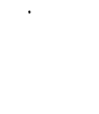

In [138]:
padded_image.crop(cells[0])

## Cells to DataFrame

Now that you have each cell, what do you need to do get a DataFrame of the table with cell values?

In [139]:
%pip install paddlepaddle paddleocr

In [140]:
!rm -rf ~/.paddleocr/

In [141]:
from paddleocr import PaddleOCR

ocr = PaddleOCR(
    lang="en",
    use_gpu=False,
    show_log=False,
)

download https://paddleocr.bj.bcebos.com/PP-OCRv3/english/en_PP-OCRv3_det_infer.tar to /root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer/en_PP-OCRv3_det_infer.tar


100%|██████████| 3910/3910 [00:19<00:00, 198.21it/s]


download https://paddleocr.bj.bcebos.com/PP-OCRv4/english/en_PP-OCRv4_rec_infer.tar to /root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer/en_PP-OCRv4_rec_infer.tar


100%|██████████| 10000/10000 [00:25<00:00, 394.74it/s]


download https://paddleocr.bj.bcebos.com/dygraph_v2.0/ch/ch_ppocr_mobile_v2.0_cls_infer.tar to /root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer/ch_ppocr_mobile_v2.0_cls_infer.tar


100%|██████████| 2138/2138 [00:09<00:00, 228.10it/s]


In [142]:
%pip install opencv-python

In [143]:
import cv2
import numpy as np

In [144]:
def PIL_to_cv(pil_img):
  return cv2.cvtColor(np.array(pil_img), cv2.COLOR_RGB2BGR)

In [145]:
results=[]
for cell in cells:
  cell_image = padded_image.crop(cell)
  result = ocr.ocr(PIL_to_cv(cell_image))
  results.append(result)


[2024/10/18 16:39:44] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2024/10/18 16:39:44] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2024/10/18 16:39:45] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2024/10/18 16:39:45] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2024/10/18 16:39:45] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2024/10/18 16:39:46] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2024/10/18 16:39:46] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2024/10/18 16:39:46] ppocr WARNING: Since the angle classifier is not initialized,

In [146]:
%pip install pandas

In [147]:
import pandas as pd

In [148]:
num_rows = len(sorted_rows)
num_cols = len(sorted_cols)

df = pd.DataFrame(index=range(num_rows), columns=range(num_cols))

In [149]:
for i, result in enumerate(results):
  # Check if result is valid and contains the expected data structure
  if result and result[0] and result[0][0] and result[0][0][1]:
    df.iloc[i // num_cols, i % num_cols] = result[0][0][1][0]
  else:
    # Handle the case where result is None or has an unexpected structure
    # You might want to log this, assign a default value, or skip the cell
    print(f"Warning: OCR result for cell {i} is invalid: {result}")
    df.iloc[i // num_cols, i % num_cols] = ""  # Assign an empty string as an example

In [150]:
df

,0,1,2,3,4,5,6,7
0,,,,,,,,
1,,value),as,the review,"'s, the resu",lt is matc,hing.,
2,,,,P-value,from Wilcoxg,on's,le Test,
3,,,,Chang,From Baselin,e in,,
4,,,,Number of,S,*Time,CGI Improvement,
5,,,,Panic.,s,Worrying,CGI,
6,,,,,,,,
7,,Week 1,,1.000,.707,.474,.040,
8,,Neek,,000,707,4/4,.040,
9,,Week 2,,067,232,478,.040,


In [151]:
df.colums =df.iloc[0].tolist()
df.drop(df.index[0], inplace=True)

In [152]:
df

,0,1,2,3,4,5,6,7
1,,value),as,the review,"'s, the resu",lt is matc,hing.,
2,,,,P-value,from Wilcoxg,on's,le Test,
3,,,,Chang,From Baselin,e in,,
4,,,,Number of,S,*Time,CGI Improvement,
5,,,,Panic.,s,Worrying,CGI,
6,,,,,,,,
7,,Week 1,,1.000,.707,.474,.040,
8,,Neek,,000,707,4/4,.040,
9,,Week 2,,067,232,478,.040,
10,,Week 3,,007,12,489,.O0,


In [153]:
df.iloc[-1].tolist()

['',
 'Eight pa',
 'atie',
 'ents withd',
 'w from the s',
 'ertraline',
 'roup due to',
 'ne']

In [154]:
df.columns

RangeIndex(start=0, stop=8, step=1)

In [155]:
df.colums =df.iloc[0].tolist()
df.drop(df.index[0], inplace=True)

In [156]:
df

,0,1,2,3,4,5,6,7
2,,,,P-value,from Wilcoxg,on's,le Test,
3,,,,Chang,From Baselin,e in,,
4,,,,Number of,S,*Time,CGI Improvement,
5,,,,Panic.,s,Worrying,CGI,
6,,,,,,,,
7,,Week 1,,1.000,.707,.474,.040,
8,,Neek,,000,707,4/4,.040,
9,,Week 2,,067,232,478,.040,
10,,Week 3,,007,12,489,.O0,
11,,,,007,,489,.017,


In [157]:
df.iloc[-1].tolist()

['',
 'Eight pa',
 'atie',
 'ents withd',
 'w from the s',
 'ertraline',
 'roup due to',
 'ne']

In [158]:
df.columns

RangeIndex(start=0, stop=8, step=1)

In [159]:
df = df.iloc[1:]

In [160]:
df

,0,1,2,3,4,5,6,7
3,,,,Chang,From Baselin,e in,,
4,,,,Number of,S,*Time,CGI Improvement,
5,,,,Panic.,s,Worrying,CGI,
6,,,,,,,,
7,,Week 1,,1.000,.707,.474,.040,
8,,Neek,,000,707,4/4,.040,
9,,Week 2,,067,232,478,.040,
10,,Week 3,,007,12,489,.O0,
11,,,,007,,489,.017,
12,,week,,,.028,406,.064,


In [191]:
df.to_csv("/content/drive/MyDrive/csv_outs/001e626d00966d0268d44ce686e8559b-118.csv", index=False)

Try implementation for 0005ab896e95c5de6885bbf595500a8e-66.png

In [190]:
table_image_path = "/content/drive/MyDrive/idp_bootcamp/week_3/hands_on_session/data/0005ab896e95c5de6885bbf595500a8e-66.png"

In [97]:
from huggingface_hub import hf_hub_download
from transformers import AutoImageProcessor, TableTransformerForObjectDetection
import torch
from PIL import Image

image = Image.open(table_image_path).convert("RGB")

In [98]:
image_processor = AutoImageProcessor.from_pretrained("microsoft/table-transformer-detection")
model = TableTransformerForObjectDetection.from_pretrained("microsoft/table-transformer-detection")

inputs = image_processor(images=image, return_tensors="pt")
outputs = model(**inputs)

# convert outputs (bounding boxes and class logits) to Pascal VOC format (xmin, ymin, xmax, ymax)
target_sizes = torch.tensor([image.size[::-1]])
results = image_processor.post_process_object_detection(outputs, threshold=0.9, target_sizes=target_sizes)[
    0
]

for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    print(
        f"Detected {model.config.id2label[label.item()]} with confidence "
        f"{round(score.item(), 3)} at location {box}"
    )

Some weights of the model checkpoint at microsoft/table-transformer-detection were not used when initializing TableTransformerForObjectDetection: ['model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing TableTransformerForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TableTransformerForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Detected table with confidence 1.0 at location [139.92, 207.43, 1072.27, 739.92]


In [99]:
from PIL import ImageDraw

def visualize_bbox(table_image, box, color="red", width=2):
  """
  Visualizes a bounding box on a PIL image.

  Args:
    image: A PIL Image object.
    box: A list or tuple of four integers representing the bounding box
         coordinates (xmin, ymin, xmax, ymax).
    color: The color of the bounding box (default: red).
    width: The width of the bounding box lines (default: 2).
  """

  draw = ImageDraw.Draw(image)
  draw.rectangle(box, outline=color, width=width)
  return table_image


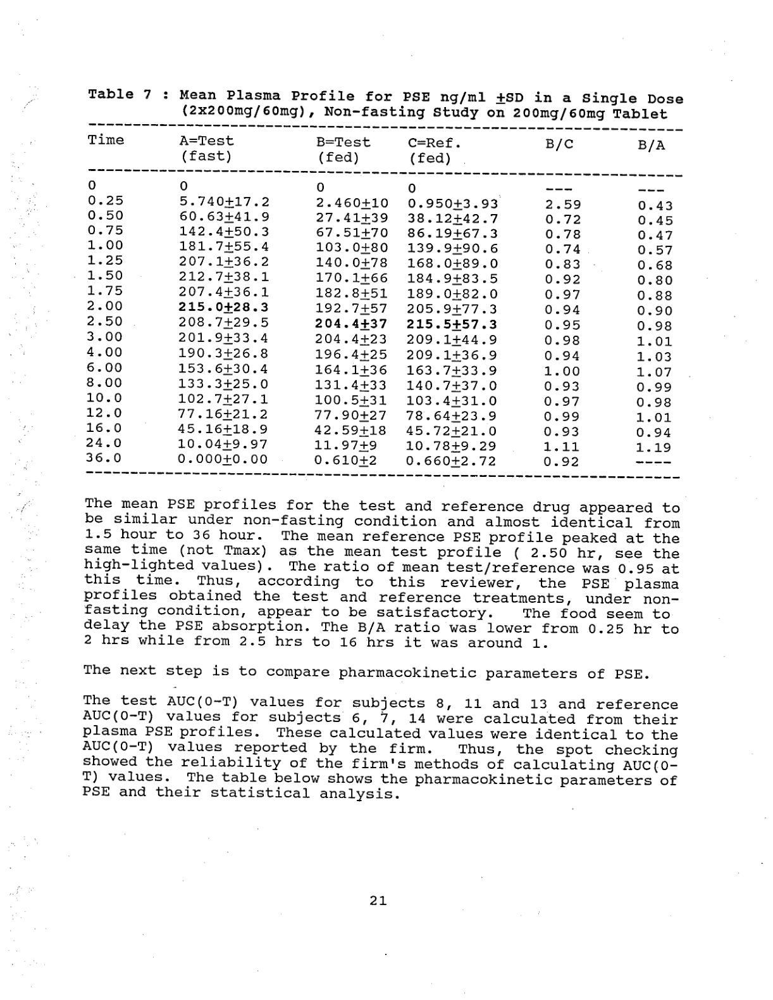

In [100]:
image

In [101]:
from PIL import ImageDraw

def visualize_bbox(image, box, color="red", width=2):
  """
  Visualizes a bounding box on a PIL image.

  Args:
    image: A PIL Image object.
    box: A list or tuple of four integers representing the bounding box
         coordinates (xmin, ymin, xmax, ymax).
    color: The color of the bounding box (default: red).
    width: The width of the bounding box lines (default: 2).
  """

  draw = ImageDraw.Draw(image)
  draw.rectangle(box, outline=color, width=width)
  return image


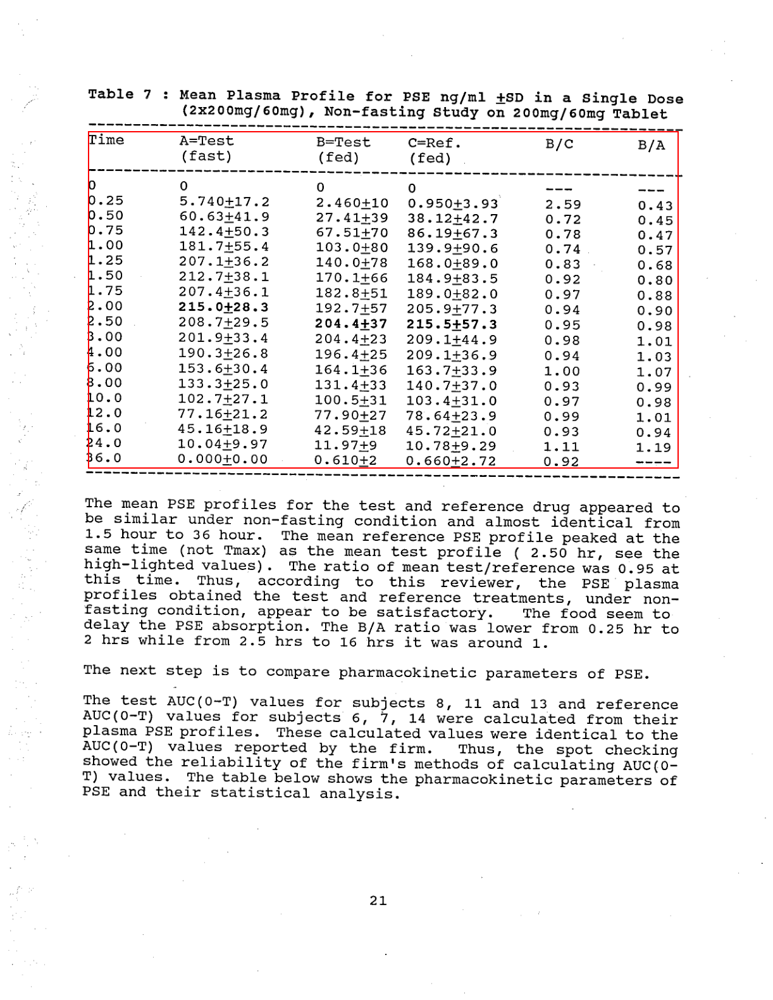

In [102]:
visualize_bbox(image, results["boxes"][0].tolist())

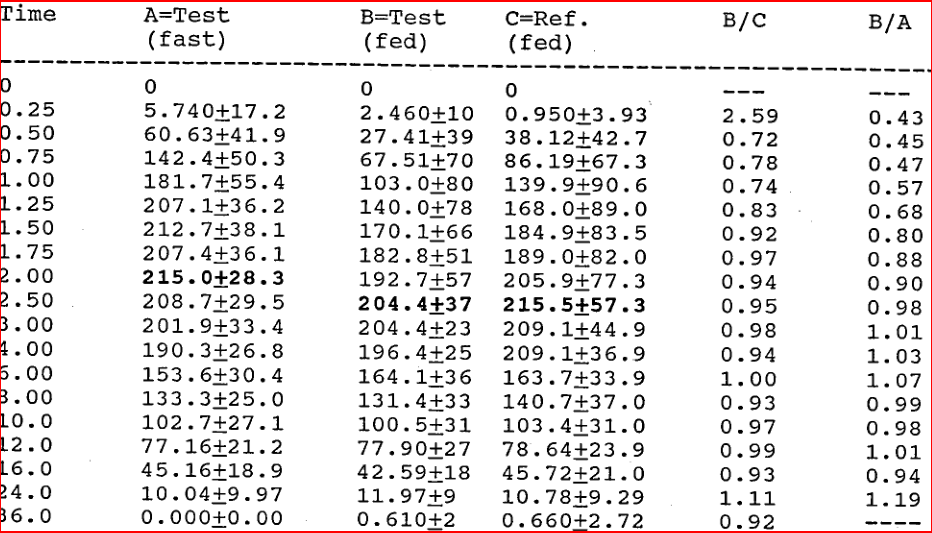

In [103]:
table_image = image.crop(box)

table_image

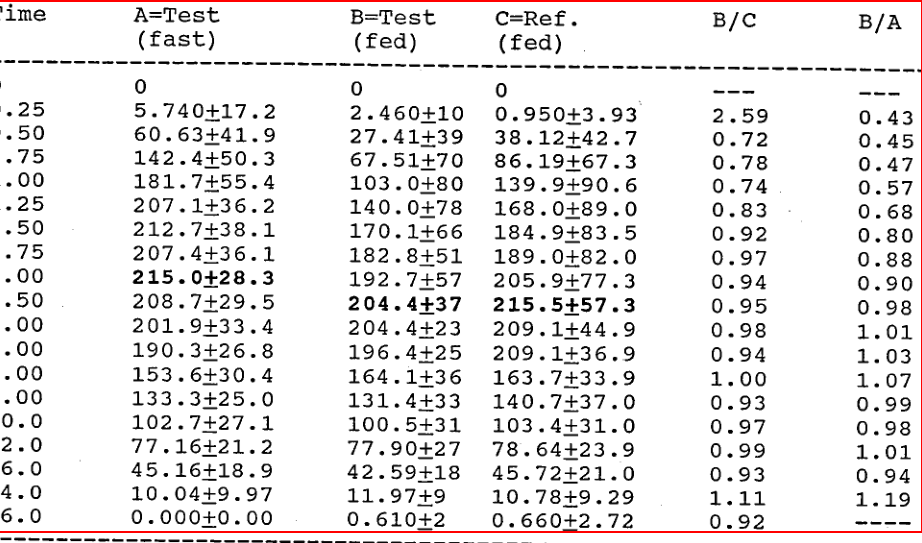

In [104]:
padding = 10

box = [box[0] + padding, box[1], box[2], box[3] + padding]

table_image = image.crop(box)

table_image

In [105]:
import matplotlib.pyplot as plt
from transformers import DetrFeatureExtractor, DetrForObjectDetection

In [106]:
COLORS = [
    [0.000, 0.447, 0.741],
    [0.850, 0.325, 0.098],
    [0.929, 0.694, 0.125],
    [0.494, 0.184, 0.556],
    [0.466, 0.674, 0.188],
    [0.301, 0.745, 0.933],
]

def plot_simple_box(table_img, bboxes, file_name="output.png"):
    plt.figure(figsize=(16, 10))
    plt.imshow(table_img)
    ax = plt.gca()
    colors = COLORS * 100
    for bbox, c in zip(bboxes, colors):
        ax.add_patch(
            plt.Rectangle(
                (bbox[0], bbox[1]),
                bbox[2] - bbox[0],
                bbox[3] - bbox[1],
                fill=False,
                color=c,
                linewidth=0.5,
            )
        )
    plt.axis("off")
    plt.show()
    plt.savefig(f"{file_name}.png", bbox_inches="tight")




In [107]:
model_structure = TableTransformerForObjectDetection.from_pretrained(
    "microsoft/table-transformer-structure-recognition")


def get_row_col_bounds(table, ts_thresh=0.7, plot=False):
    feature_extractor = DetrFeatureExtractor()
    table_encoding = feature_extractor(table, return_tensors="pt")

    # predict table structure
    with torch.no_grad():
        outputs = model_structure(**table_encoding)

    # visualize table structure
    target_sizes = [table.size[::-1]]
    table_struct_results = feature_extractor.post_process_object_detection(
        outputs, threshold=ts_thresh, target_sizes=target_sizes
    )[0]


    row_boxes = table_struct_results["boxes"][
        table_struct_results["labels"] == model_structure.config.label2id["table row"]
    ]

    row_scores = table_struct_results["scores"][
        table_struct_results["labels"] == model_structure.config.label2id["table row"]
    ]

    col_boxes = table_struct_results["boxes"][
        table_struct_results["labels"]
        == model_structure.config.label2id["table column"]
    ]

    col_scores = table_struct_results["scores"][
        table_struct_results["labels"]
        == model_structure.config.label2id["table column"]
    ]

    table_header_box = table_struct_results["boxes"][
        table_struct_results["labels"]
        == model_structure.config.label2id["table column header"]
    ]
    table_header_score = table_struct_results["scores"][
        table_struct_results["labels"]
        == model_structure.config.label2id["table column header"]
    ]

    print(f"Num rows initially detected: {len(row_boxes)}")
    print(f"Num cols initially detected: {len(col_boxes)}")
    print(f"Num table header detected: {len(table_header_box)}")


    return (
        row_boxes,
        row_scores,
        col_boxes,
        col_scores,
        table_header_box,
        table_header_score,
    )

Some weights of the model checkpoint at microsoft/table-transformer-structure-recognition were not used when initializing TableTransformerForObjectDetection: ['model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing TableTransformerForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TableTransformerForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [108]:
table_structure_outs = get_row_col_bounds(table_image)

Num rows initially detected: 18
Num cols initially detected: 8
Num table header detected: 1


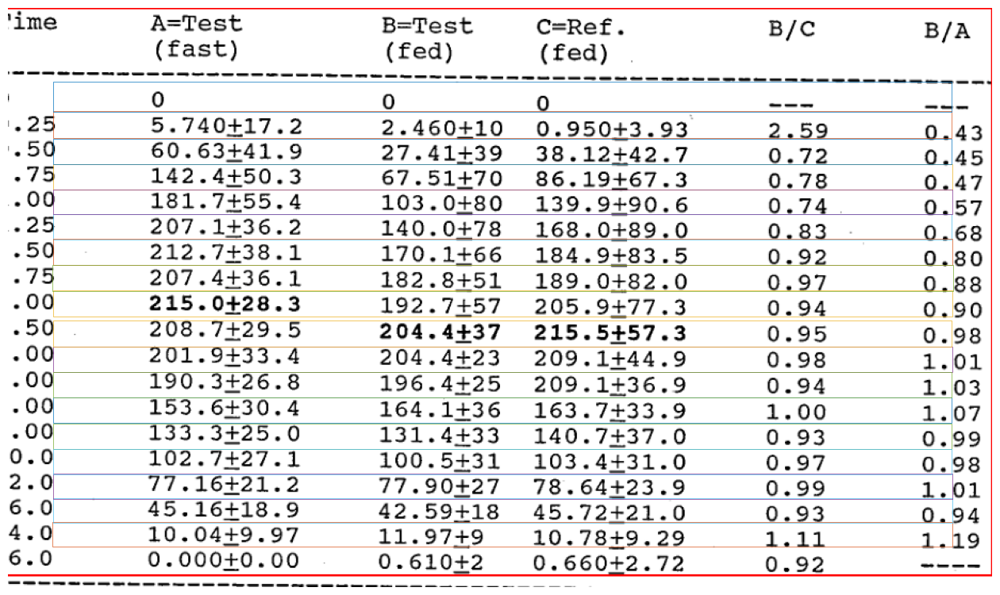

<Figure size 640x480 with 0 Axes>

In [109]:
plot_simple_box(table_image, table_structure_outs[0])

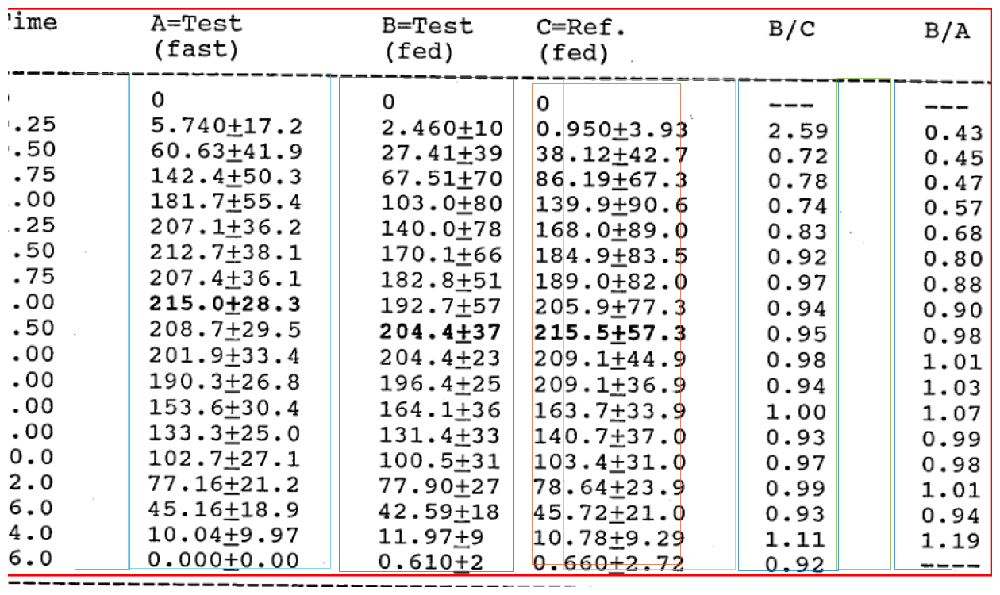

<Figure size 640x480 with 0 Axes>

In [110]:
plot_simple_box(table_image, table_structure_outs[2])

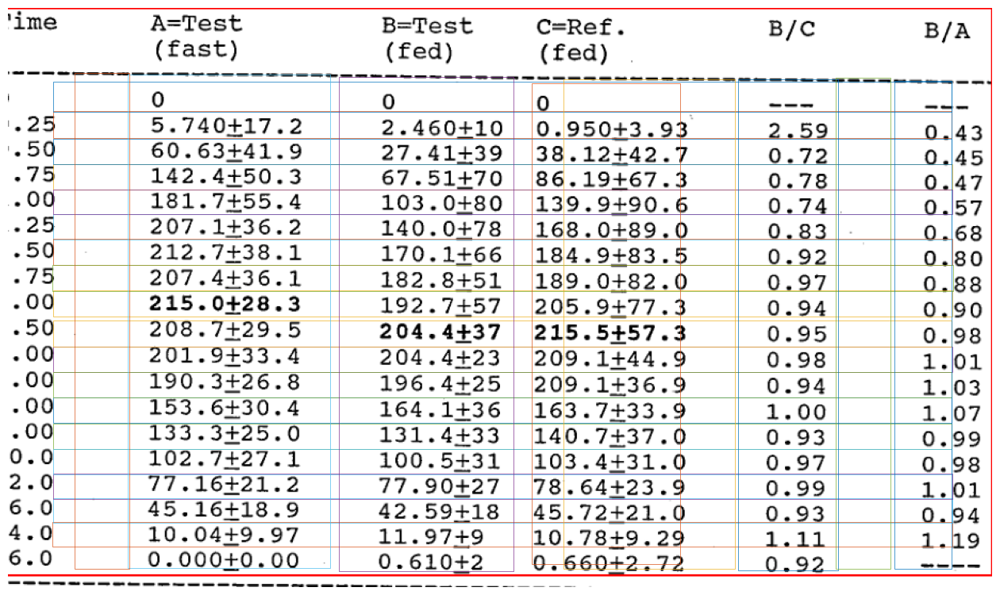

<Figure size 640x480 with 0 Axes>

In [111]:
plot_simple_box(table_image, table_structure_outs[0].tolist() + table_structure_outs[2].tolist())

In [112]:
def sort_row_col_boxes(row_boxes, col_boxes):
  row_boxes = row_boxes.tolist()
  col_boxes = col_boxes.tolist()
  row_boxes.sort(key=lambda x: x[1])
  col_boxes.sort(key=lambda x: x[0])
  return row_boxes, col_boxes

In [113]:
def get_cells_by_intersecting_rows_and_cols(row_boxes, col_boxes, padding=(0,0)):
  cells = []
  for row_box in row_boxes:
    for col_box in col_boxes:
      cells_left_upper_x = col_box[0]
      cells_left_upper_y = row_box[1]
      cells_right_lower_x = col_box[2]
      cells_right_lower_y = row_box[3]
      cells.append([cells_left_upper_x,
                    cells_left_upper_y,
                    cells_right_lower_x,
                    cells_right_lower_y])
  return cells


In [114]:
sorted_rows, sorted_cols = sort_row_col_boxes(table_structure_outs[0], table_structure_outs[2])

In [115]:
cells = get_cells_by_intersecting_rows_and_cols(sorted_rows, sorted_cols)

In [116]:
padded_image.crop(cells[0])

In [117]:
def PIL_to_cv(pil_img):
  return cv2.cvtColor(np.array(pil_img), cv2.COLOR_RGB2BGR)

In [118]:
results=[]
for cell in cells:
  cell_image = padded_image.crop(cell)
  result = ocr.ocr(PIL_to_cv(cell_image))
  results.append(result)

[2024/10/18 16:25:38] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2024/10/18 16:25:38] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2024/10/18 16:25:38] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2024/10/18 16:25:38] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2024/10/18 16:25:39] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2024/10/18 16:25:39] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2024/10/18 16:25:39] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2024/10/18 16:25:39] ppocr WARNING: Since the angle classifier is not initialized,

In [119]:
for result in results:
  print(result[0])

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
[[[[73.0, 1.0], [159.0, 2.0], [158.0, 23.0], [72.0, 22.0]], ('value)', 0.9977855682373047)], [[[179.0, 5.0], [189.0, 8.0], [187.0, 22.0], [174.0, 19.0]], ('a', 0.9977149963378906)]]
[[[[15.0, 1.0], [161.0, 2.0], [161.0, 23.0], [14.0, 21.0]], ('the revie', 0.9946581721305847)]]
[[[[2.0, 2.0], [122.0, 4.0], [121.0, 23.0], [1.0, 23.0]], ("r's, the", 0.9928293228149414)]]
[[[[2.0, 8.0], [19.0, 8.0], [19.0, 22.0], [2.0, 22.0]], ('S', 0.8987894654273987)], [[[39.0, 3.0], [159.0, 5.0], [159.0, 23.0], [39.0, 22.0]], ('the resu', 0.9528124928474426)]]
[[[[0.0, 2.0], [93.0, 2.0], [93.0, 23.0], [0.0, 23.0]], ('lt is n', 0.9492505788803101)]]
[[[[0.0, 4.0], [51.0, 4.0], [51.0, 23.0], [0.0, 23.0]], ('natc', 0.9856203198432922)]]
[[[[2.0, 3.0], [53.0, 6.0], [

In [120]:
import pandas as pd

num_rows = len(sorted_rows)
num_cols = len(sorted_cols)

df = pd.DataFrame(index=range(num_rows), columns=range(num_cols))

In [121]:
for i, result in enumerate(results):
  df.iloc[i // num_cols, i % num_cols] = result[0]

In [123]:
df.colums =df.iloc[0].tolist()
df.drop(df.index[0], inplace=True)

In [124]:
df

,0,1,2,3,4,5,6,7
1,None,None,None,None,None,None,None,None
2,None,None,None,None,None,None,None,None
3,None,None,None,None,None,None,None,None
4,None,None,None,None,None,None,None,None
5,None,None,None,None,None,None,None,None
6,None,"[[[[73.0, 1.0], [159.0, 2.0], [158.0, 23.0], [...","[[[[15.0, 1.0], [161.0, 2.0], [161.0, 23.0], [...","[[[[2.0, 2.0], [122.0, 4.0], [121.0, 23.0], [1...","[[[[2.0, 8.0], [19.0, 8.0], [19.0, 22.0], [2.0...","[[[[0.0, 2.0], [93.0, 2.0], [93.0, 23.0], [0.0...","[[[[0.0, 4.0], [51.0, 4.0], [51.0, 23.0], [0.0...","[[[[2.0, 3.0], [53.0, 6.0], [53.0, 23.0], [0.0..."
7,None,None,None,None,None,None,None,None
8,None,None,None,None,None,None,None,None
9,None,None,None,None,None,None,None,None
10,None,None,"[[[[71.0, 1.0], [161.0, 2.0], [160.0, 23.0], [...","[[[[29.0, 5.0], [131.0, 5.0], [131.0, 19.0], [...","[[[[5.0, 2.0], [156.0, 5.0], [156.0, 21.0], [5...",None,"[[[[1.0, 2.0], [51.0, 7.0], [50.0, 23.0], [0.0...",None


In [126]:
df.to_csv("/content/drive/MyDrive/idp_bootcamp/week_3/hands_on_session/data/0005ab896e95c5de6885bbf595500a8e-66.csv", index=False)